In [1]:
import config
import re 
import pandas as pd
import plotly.express as px
from collections import Counter
import matplotlib.pyplot as plt
import plotly.express as px
from wordcloud import WordCloud

In [2]:
train_df = pd.read_csv(config.TRAIN_DIR)
train_df.shape

(20972, 12)

In [3]:
train_df.head()

,ID,TITLE,ABSTRACT,Computer Science,Physics,Mathematics,Statistics,Quantitative Biology,Quantitative Finance,clean_abstract,clean_title,pairs
0,1,Reconstructing Subject-Specific Effect Maps,Predictive models allow subject-specific inf...,1,0,0,0,0,0,predictive models allow subject specific infer...,reconstructing subject specific effect maps,('reconstructing subject specific effect maps'...
1,2,Rotation Invariance Neural Network,Rotation invariance and translation invarian...,1,0,0,0,0,0,rotation invariance and translation invariance...,rotation invariance neural network,"('rotation invariance neural network', 'rotati..."
2,3,Spherical polyharmonics and Poisson kernels fo...,We introduce and develop the notion of spher...,0,0,1,0,0,0,we introduce and develop the notion of spheric...,spherical polyharmonics and poisson kernels fo...,('spherical polyharmonics and poisson kernels ...
3,4,A finite element approximation for the stochas...,The stochastic Landau--Lifshitz--Gilbert (LL...,0,0,1,0,0,0,the stochastic landau lifshitz gilbert llg equ...,a finite element approximation for the stochas...,('a finite element approximation for the stoch...
4,5,Comparative study of Discrete Wavelet Transfor...,Fourier-transform infra-red (FTIR) spectra o...,1,0,0,1,0,0,fourier transform infra red ftir spectra of sa...,comparative study of discrete wavelet transfor...,('comparative study of discrete wavelet transf...


In [4]:
train_df.columns

Index(['ID', 'TITLE', 'ABSTRACT', 'Computer Science', 'Physics', 'Mathematics',
       'Statistics', 'Quantitative Biology', 'Quantitative Finance',
       'clean_abstract', 'clean_title', 'pairs'],
      dtype='object')

In [5]:
print(f"Total number of articles : {train_df.shape[0]}")
print(f"Number of missing values : {train_df.isnull().sum().sum()}")

Total number of articles : 20972
Number of missing values : 0


In [45]:
d = train_df[config.LABELS].values.sum(axis = 0)

In [46]:
d.sum()

array([8594, 6013, 5618, 5206,  587,  249])

In [49]:
total_len = len(train_df)
def neg_pos(d,total_len):
    weights = (total_len- d)/d
    return weights
    
neg_pos(d,total_len)

array([ 1.44030719,  2.48777648,  2.73300107,  3.02842874, 34.7274276 ,
       83.2248996 ])

array([ 1.44030719,  2.48777648,  2.73300107,  3.02842874, 34.7274276 ,
       83.2248996 ])

In [6]:
fig = px.bar(
    train_df[config.labels].sum(axis = 0),
    color = config.labels,
    labels= {"index":"Labels ------------->","value" : "Occurrence ------------->"},
    title= "Class Distribution Plot",
    height=600,
    text_auto=True)
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False,)
fig.show()

In [7]:
for col in ['TITLE','ABSTRACT']:
    print(f"Number of repeated {col} : {[len(x) for x in list(dict(Counter(train_df[col])).values()) if x > 1]}")

Number of repeated TITLE : []
Number of repeated ABSTRACT : []


In [8]:
for col in ['TITLE','ABSTRACT']:
    count = 0
    for x in list(dict(Counter(train_df[col])).values()):
        if x > 1:
            count += 1
        else:
            count = 0
    print(f"Number of repeated {col} in dataset : {count}")

Number of repeated TITLE in dataset : 0
Number of repeated ABSTRACT in dataset : 0


In [9]:
lengths = list()
for sentence in train_df['ABSTRACT']:
    lengths.append(len(sentence.split()))
print(f"Maximum word sentence : {max(lengths)}")

Maximum word sentence : 449


In [10]:
fig = px.histogram(
    lengths,
    labels={'value':'Sequence length', 'count':'Counts'},
    title= "Counts of sequence lengths",
    text_auto = True,
)
fig.update_layout(bargap=0.2)
fig.show()

In [11]:
taged_words_len = len(train_df.ABSTRACT.str.extractall(r'(\#\w+)')[0].value_counts())
print(f"There are {taged_words_len} # taged words")

There are 14 # taged words


In [12]:
tag_data = train_df.ABSTRACT.str.extractall(r'(\#\w+)')[0]
fig = px.histogram(x = tag_data,
            color = tag_data.tolist(),
            labels = {'x' : "tag words"},
            title = 'Words follws with # tags',
            )
fig.show()

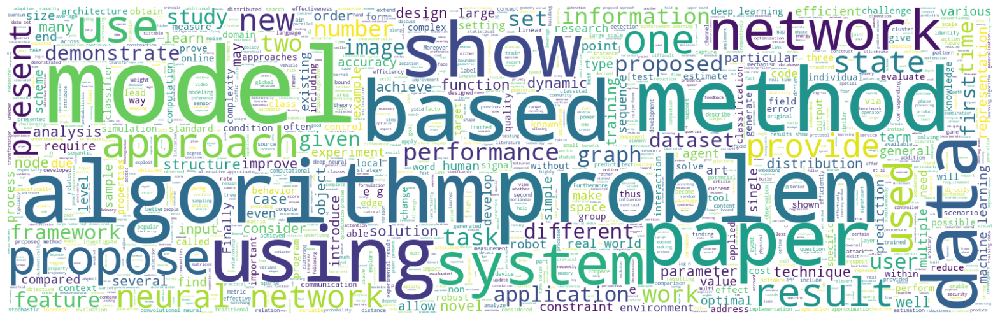

In [13]:
# computer science related words
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 2000 , width = 1600 , height = 500, background_color="white").generate(" ".join(train_df[train_df["Computer Science"] == 1]["ABSTRACT"]))
plt.imshow(wc , interpolation = 'bilinear')
plt.axis("off")
plt.show()

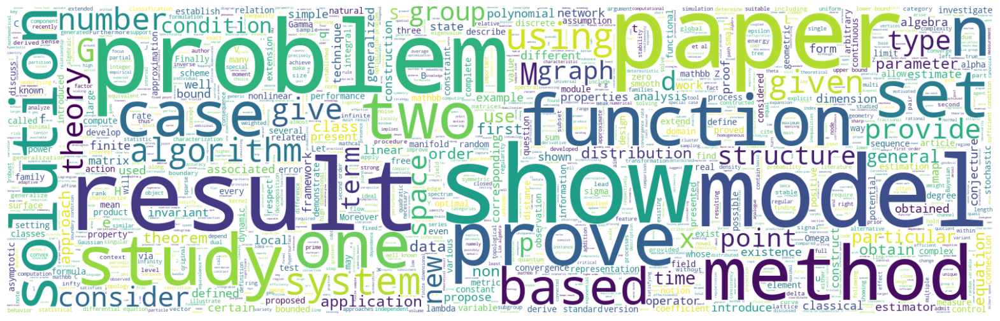

In [14]:
# Mathematics related words
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 2000 , width = 1600 , height = 500, background_color="white").generate(" ".join(train_df[train_df["Mathematics"] == 1]["ABSTRACT"]))
plt.imshow(wc , interpolation = 'bilinear')
plt.axis("off")
plt.show()

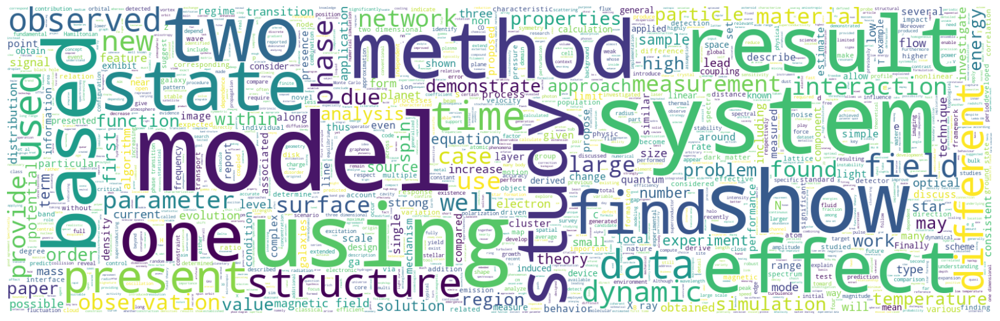

In [15]:
# Physics related words
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 2000 , width = 1600 , height = 500, background_color="white").generate(" ".join(train_df[train_df["Physics"] == 1]["ABSTRACT"]))
plt.imshow(wc , interpolation = 'bilinear')
plt.axis("off")
plt.show()

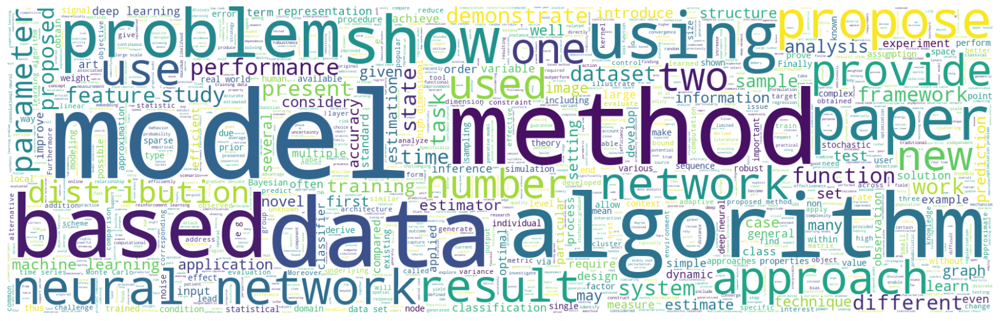

In [16]:
# Statistics related words
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 2000 , width = 1600 , height = 500, background_color="white").generate(" ".join(train_df[train_df["Statistics"] == 1]["ABSTRACT"]))
plt.imshow(wc , interpolation = 'bilinear')
plt.axis("off")
plt.show()

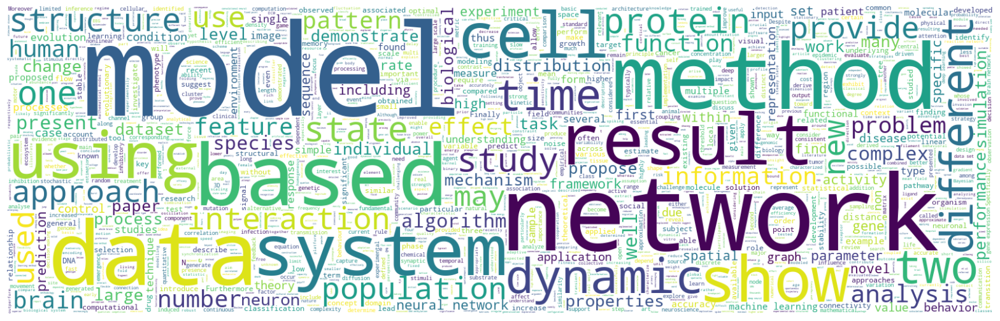

In [17]:
# Quantitative Biology related words
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 2000 , width = 1600 , height = 500, background_color="white").generate(" ".join(train_df[train_df["Quantitative Biology"] == 1]["ABSTRACT"]))
plt.imshow(wc , interpolation = 'bilinear')
plt.axis("off")
plt.show()

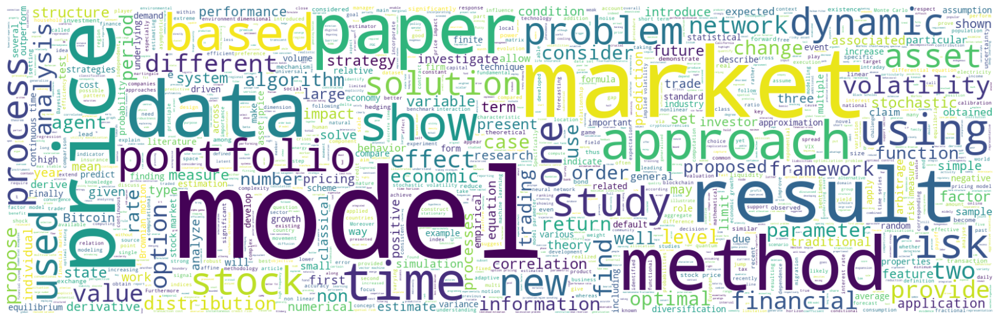

In [18]:
# Quantitative Finance related words
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 2000 , width = 1600 , height = 500, background_color="white").generate(" ".join(train_df[train_df["Quantitative Finance"] == 1]["ABSTRACT"]))
plt.imshow(wc , interpolation = 'bilinear')
plt.axis("off")
plt.show()

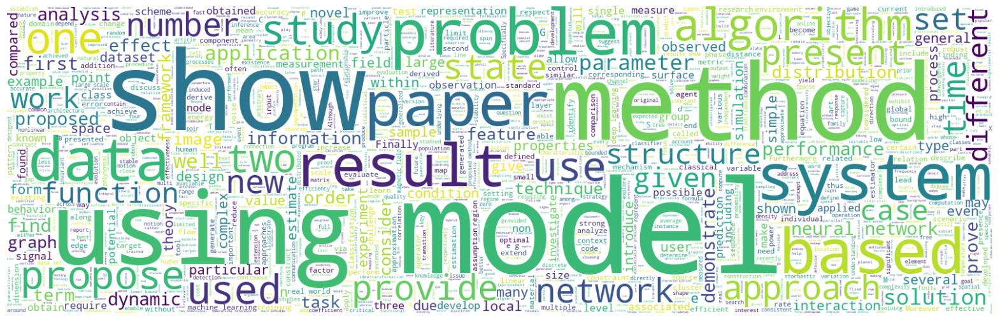

In [19]:
# all abstract more frequency words
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 2000 , width = 1600 , height = 500, background_color="white").generate(" ".join(train_df["ABSTRACT"]))
plt.imshow(wc , interpolation = 'bilinear')
plt.axis("off")
plt.show()

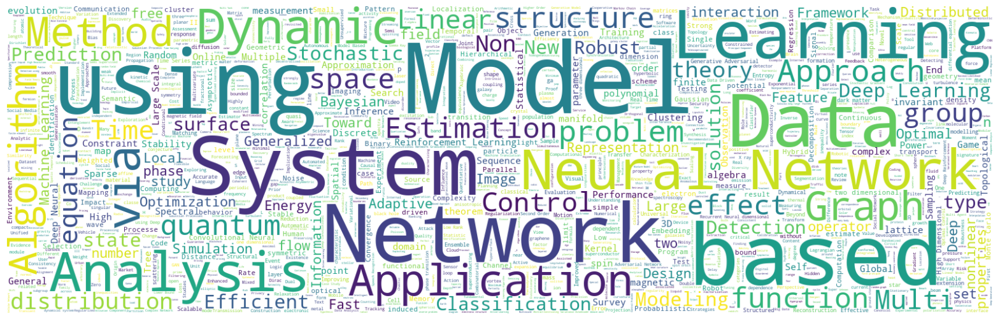

In [20]:
# all title more frequency words
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 2000 , width = 1600 , height = 500, background_color="white").generate(" ".join(train_df['TITLE']))
plt.imshow(wc , interpolation = 'bilinear')
plt.axis("off")
plt.show()

In [21]:
counter = Counter(" ".join(train_df["ABSTRACT"]).split())
words = list()
counts = list()
for w,v in counter.most_common(100):
    words.append(w)
    counts.append(v)

px.bar(
    x = words,
    y = counts,
    color=words,
    labels= {"x":"Frequently occured words","y":"Number of time word occured"}
)

In [19]:
def clean_text(text):
    text = re.sub(r'(\#\w+)'," ",text) 
    text = re.sub(r"br","",text)
    text = re.sub(r'[^\w\s]', ' ', text)
    text = re.sub('[^a-zA-Z]+',' ',text)
    text = text.lower()
    return text.strip()
    
train_df['clean_abstract'] = train_df['ABSTRACT'].apply(lambda x : clean_text(x))
train_df['clean_title'] = train_df['TITLE'].apply(lambda x : clean_text(x))


In [20]:
train_df[config.LABELS].values

array([[1, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0],
       [0, 0, 1, 0, 0, 0],
       ...,
       [1, 0, 0, 0, 0, 0],
       [0, 0, 1, 1, 0, 0],
       [0, 0, 1, 1, 0, 0]])

In [21]:
train_df.head()

,ID,TITLE,ABSTRACT,Computer Science,Physics,Mathematics,Statistics,Quantitative Biology,Quantitative Finance,clean_abstract,clean_title,pairs
0,1,Reconstructing Subject-Specific Effect Maps,Predictive models allow subject-specific inf...,1,0,0,0,0,0,predictive models allow subject specific infer...,reconstructing subject specific effect maps,('reconstructing subject specific effect maps'...
1,2,Rotation Invariance Neural Network,Rotation invariance and translation invarian...,1,0,0,0,0,0,rotation invariance and translation invariance...,rotation invariance neural network,"('rotation invariance neural network', 'rotati..."
2,3,Spherical polyharmonics and Poisson kernels fo...,We introduce and develop the notion of spher...,0,0,1,0,0,0,we introduce and develop the notion of spheric...,spherical polyharmonics and poisson kernels fo...,('spherical polyharmonics and poisson kernels ...
3,4,A finite element approximation for the stochas...,The stochastic Landau--Lifshitz--Gilbert (LL...,0,0,1,0,0,0,the stochastic landau lifshitz gilbert llg equ...,a finite element approximation for the stochas...,('a finite element approximation for the stoch...
4,5,Comparative study of Discrete Wavelet Transfor...,Fourier-transform infra-red (FTIR) spectra o...,1,0,0,1,0,0,fourier transform infra red ftir spectra of sa...,comparative study of discrete wavelet transfor...,('comparative study of discrete wavelet transf...


In [16]:
from tqdm.auto import tqdm
pairs = list()
for idx in tqdm(range(len(train_df)),total = len(train_df)):
    pairs.append(tuple(train_df[['clean_title','clean_abstract']].iloc[idx]))

100%|██████████| 20972/20972 [00:14<00:00, 1401.80it/s]


In [80]:
assert len(train_df) == len(pairs)
train_df['pairs'] = pairs

In [9]:
train_df['pairs'][0]

"('reconstructing subject specific effect maps', 'predictive models allow subject specific inference when analyzing disease related alterations in neuroimaging data given a subject s data inference can be made at two levels global i e identifiying condition presence for the subject and local i e detecting condition effect on each individual measurement extracted from the subject s data while global inference is widely used local inference which can be used to form subject specific effect maps is rarely used because existing models often yield noisy detections composed of dispersed isolated islands in this article we propose a reconstruction method named rsm to improve subject specific detections of predictive modeling approaches and in particular binary classifiers rsm specifically aims to reduce noise due to sampling error associated with using a finite sample of examples to train classifiers the proposed method is a wrapper type algorithm that can be used with different binary classi

In [35]:
import transformers
from transformers import AutoTokenizer

In [82]:
tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")

In [54]:
tokenizer.encode_plus(sentence)

{'input_ids': [101, 28667, 5644, 26310, 3395, 3563, 3466, 7341, 102, 16014, 3512, 4275, 3499, 3395, 3563, 28937, 2043, 20253, 4295, 3141, 16705, 1999, 11265, 10976, 9581, 4726, 2951, 2445, 1037, 3395, 1055, 2951, 28937, 2064, 2022, 2081, 2012, 2048, 3798, 3795, 1045, 1041, 8909, 4765, 10128, 28008, 2075, 4650, 3739, 2005, 1996, 3395, 1998, 2334, 1045, 1041, 25952, 4650, 3466, 2006, 2169, 3265, 10903, 15901, 2013, 1996, 3395, 1055, 2951, 2096, 3795, 28937, 2003, 4235, 2109, 2334, 28937, 2029, 2064, 2022, 2109, 2000, 2433, 3395, 3563, 3466, 7341, 2003, 6524, 2109, 2138, 4493, 4275, 2411, 10750, 20810, 10788, 2015, 3605, 1997, 15484, 7275, 3470, 1999, 2023, 3720, 2057, 16599, 1037, 8735, 4118, 2315, 12667, 2213, 2000, 5335, 3395, 3563, 10788, 2015, 1997, 16014, 3512, 11643, 8107, 1998, 1999, 3327, 12441, 2465, 28295, 12667, 2213, 4919, 8704, 2000, 5547, 5005, 2349, 2000, 16227, 7561, 3378, 2007, 2478, 1037, 10713, 7099, 1997, 4973, 2000, 3345, 2465, 28295, 1996, 3818, 4118, 2003, 1037, 10

In [44]:
print(tokenizer.tokenize(tuple(sentence)))

['rec', '##ons', '##tructing', 'subject', 'specific', 'effect', 'maps', 'predict', '##ive', 'models', 'allow', 'subject', 'specific', 'inference', 'when', 'analyzing', 'disease', 'related', 'alterations', 'in', 'ne', '##uro', '##ima', '##ging', 'data', 'given', 'a', 'subject', 's', 'data', 'inference', 'can', 'be', 'made', 'at', 'two', 'levels', 'global', 'i', 'e', 'id', '##ent', '##if', '##iy', '##ing', 'condition', 'presence', 'for', 'the', 'subject', 'and', 'local', 'i', 'e', 'detecting', 'condition', 'effect', 'on', 'each', 'individual', 'measurement', 'extracted', 'from', 'the', 'subject', 's', 'data', 'while', 'global', 'inference', 'is', 'widely', 'used', 'local', 'inference', 'which', 'can', 'be', 'used', 'to', 'form', 'subject', 'specific', 'effect', 'maps', 'is', 'rarely', 'used', 'because', 'existing', 'models', 'often', 'yield', 'noisy', 'detection', '##s', 'composed', 'of', 'dispersed', 'isolated', 'islands', 'in', 'this', 'article', 'we', 'propose', 'a', 'reconstruction',

In [67]:
params = {k:v for k,v in config.__dict__.items() if "__" not in k}


In [84]:
train_df[params['labels']].values

array([[1, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0],
       [0, 0, 1, 0, 0, 0],
       ...,
       [1, 0, 0, 0, 0, 0],
       [0, 0, 1, 1, 0, 0],
       [0, 0, 1, 1, 0, 0]])

In [85]:
from sklearn.model_selection import train_test_split


In [86]:
train,test = train_test_split(
        train_df,
        test_size=0.2,
        shuffle=True
    )

In [87]:
train.shape,test.shape

((16777, 12), (4195, 12))

In [88]:
train.head()

,ID,TITLE,ABSTRACT,Computer Science,Physics,Mathematics,Statistics,Quantitative Biology,Quantitative Finance,clean_abstract,clean_title,pairs
9301,9302,A Tractable Approach to Dynamic Network Dimens...,Spatial distributions of other cell interfer...,1,0,0,0,0,0,spatial distributions of other cell interferen...,a tractable approach to dynamic network dimens...,(a tractable approach to dynamic network dimen...
211,212,Experimental Design of a Prescribed Burn Instr...,Observational data collected during experime...,0,0,0,1,0,0,observational data collected during experiment...,experimental design of a prescribed burn instr...,(experimental design of a prescribed burn inst...
9142,9143,A feasibility study on SSVEP-based interaction...,Non-invasive steady-state visual evoked pote...,1,0,0,0,0,0,non invasive steady state visual evoked potent...,a feasibility study on ssvep based interaction...,(a feasibility study on ssvep based interactio...
12663,12664,Controlling seizure propagation in large-scale...,Information transmission in the human brain ...,0,0,0,0,1,0,information transmission in the human ain is a...,controlling seizure propagation in large scale...,(controlling seizure propagation in large scal...
3183,3184,Controller Synthesis for Discrete-time Hybrid ...,We present a novel controller synthesis appr...,1,0,0,0,0,0,we present a novel controller synthesis approa...,controller synthesis for discrete time hyid po...,(controller synthesis for discrete time hyid p...
